## Importing all necessary libraries

In [1]:
#Key Libraires
import requests
import os
import time
import cv2

# Basic Libraries
import pandas as pd
import numpy as np

#Visualization Libraries
import seaborn as sns
import matplotlib.pyplot as plt

#Image Processing Libraries
from PIL import Image
from torchvision.transforms.functional import resize
from torchvision import transforms
from scipy.ndimage import laplace

#Model Implementation Libraries
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
from sklearn.model_selection import train_test_split
from tqdm import tqdm
import torchvision.transforms as transforms

#GUI
import sys
from PyQt5.QtWidgets import QApplication, QWidget, QPushButton, QLabel, QVBoxLayout, QFileDialog
from PyQt5.QtGui import QPixmap, QImage
from PyQt5 import QtCore  

## Data Scraping 
### Scraping Code Using Pixabay API

In [4]:
API_KEY = '43276409-c99baad788af39ed07b1963fe'
BASE_URL = 'https://pixabay.com/api/'
PAGE_LIMIT = 200  
NUM_PAGES = 4  
EXPLORE_IMG= ['man', 'woman','kids','creature', 'plant', 'automobile']

### Scraping image data based on search

In [5]:
def img_data(explore_img):        #Defining Function for scraping image data based on classes!
    os.makedirs(f'images/{explore_img}', exist_ok=True)
    for page in range(1, NUM_PAGES + 1):
        params = {
            'key': API_KEY,
            'q': explore_img,
            'image_type': 'photo',
            'per_page': PAGE_LIMIT,
            'page': page
        }
        response = requests.get(BASE_URL, params=params)    # Gerenrating request to fetch response! 
        if response.status_code == 200:
            try:
                raw_data = response.json()
                for i, image in enumerate(raw_data['hits']):
                    img_link = image['largeImageURL']
                    img_response = requests.get(img_link)
                    with open(f'images/{explore_img}/{explore_img}_{page}_{i}.jpg', 'wb') as f:
                        f.write(img_response.content)
            except ValueError as e:
                print(f'Error observed while parsing JSON: {e}')
                time.sleep(1)  
        else:
            print(f'Error: {response.status_code} - {response.text}')
            time.sleep(1)  

for explore_img in EXPLORE_IMG:      # Storing fetched image data!
    print(f'STORING IMAGE FOR: {explore_img}')
    img_data(explore_img)
    print(f'DATA STORED SUCESSFULLY!: {explore_img}')

STORING IMAGE FOR: man
Error: 400 - [ERROR 400] "page" is out of valid range.
DATA STORED SUCESSFULLY!: man
STORING IMAGE FOR: woman
Error: 400 - [ERROR 400] "page" is out of valid range.
DATA STORED SUCESSFULLY!: woman
STORING IMAGE FOR: kids
Error: 400 - [ERROR 400] "page" is out of valid range.
DATA STORED SUCESSFULLY!: kids
STORING IMAGE FOR: creature
Error: 400 - [ERROR 400] "page" is out of valid range.
DATA STORED SUCESSFULLY!: creature
STORING IMAGE FOR: plant
Error: 400 - [ERROR 400] "page" is out of valid range.
DATA STORED SUCESSFULLY!: plant
STORING IMAGE FOR: automobile
Error: 400 - [ERROR 400] "page" is out of valid range.
DATA STORED SUCESSFULLY!: automobile


# Data Extraction

In [17]:
in_image = ['C:\\Users\\rahul\\OneDrive\\Desktop\\AML2203 Advance Python\\Project\\images\\woman', 'C:\\Users\\rahul\\OneDrive\\Desktop\\AML2203 Advance Python\\Project\\images\\man', 'C:\\Users\\rahul\\OneDrive\\Desktop\\AML2203 Advance Python\\Project\\images\\plant', 'C:\\Users\\rahul\\OneDrive\\Desktop\\AML2203 Advance Python\\Project\\images\\kids', 'C:\\Users\\rahul\\OneDrive\\Desktop\\AML2203 Advance Python\\Project\\images\\automobile', 'C:\\Users\\rahul\\OneDrive\\Desktop\\AML2203 Advance Python\\Project\\images\\creature']
# Directory for stored image data!

## Pre-Processing
### Converting image data as per requirement

In [18]:
def img_lowgrading(img_path, out_image):    #defining function to degrade the quality of the images for processing!
  
    os.makedirs(os.path.join(out_image, 'low_resolution'), exist_ok=True) #Output Directories!
    os.makedirs(os.path.join(out_image, 'noisy'), exist_ok=True)
    os.makedirs(os.path.join(out_image, 'underexposed'), exist_ok=True)
    os.makedirs(os.path.join(out_image, 'overexposed'), exist_ok=True)
    os.makedirs(os.path.join(out_image, 'compressed'), exist_ok=True)

    
    og_img = cv2.imread(img_path)  # calling original images!
    img_name = os.path.basename(img_path)

    
    low_resolution = cv2.resize(og_img, (64, 64)) # low-resolution images!
    low_resolution = cv2.resize(low_resolution, og_img.shape[:2][::-1])
    cv2.imwrite(os.path.join(out_image, 'low_resolution', img_name), low_resolution)

    
    noise = np.random.normal(0, 25, og_img.shape).astype(np.uint8) # noisy images!
    noisy = cv2.add(og_img, noise)
    cv2.imwrite(os.path.join(out_image, 'noisy', img_name), noisy)

    
    underexposed = cv2.convertScaleAbs(og_img, alpha=0.5, beta=0) # underexposed images!
    cv2.imwrite(os.path.join(out_image, 'underexposed', img_name), underexposed)

    
    overexposed = cv2.convertScaleAbs(og_img, alpha=1.5, beta=0) # overexposed images!
    cv2.imwrite(os.path.join(out_image, 'overexposed', img_name), overexposed)

    cv2.imwrite(os.path.join(out_image, 'compressed', img_name), og_img, [int(cv2.IMWRITE_JPEG_QUALITY), 20])
    # compressed images!


In [19]:
def img_processing(in_image, out_image):     

    for in_image in in_image:   # processing images from input directory!
        print(f'Processing images in {in_image}')

        extracted_img = [f for f in os.listdir(in_image) if os.path.isfile(os.path.join(in_image, f))]  #creating list! 

        
        for img_file in tqdm(extracted_img):       # running function for each image!
            img_path = os.path.join(in_image, img_file)
            img_lowgrading(img_path, out_image)


In [20]:
out_image = 'processed_images'
img_processing(in_image, out_image)

Processing images in C:\Users\rahul\OneDrive\Desktop\AML2203 Advance Python\Project\images\woman


100%|████████████████████████████████████████████████████████████████████████████████| 600/600 [02:28<00:00,  4.03it/s]


Processing images in C:\Users\rahul\OneDrive\Desktop\AML2203 Advance Python\Project\images\man


100%|████████████████████████████████████████████████████████████████████████████████| 600/600 [02:58<00:00,  3.36it/s]


Processing images in C:\Users\rahul\OneDrive\Desktop\AML2203 Advance Python\Project\images\plant


100%|████████████████████████████████████████████████████████████████████████████████| 600/600 [02:30<00:00,  3.99it/s]


Processing images in C:\Users\rahul\OneDrive\Desktop\AML2203 Advance Python\Project\images\kids


100%|████████████████████████████████████████████████████████████████████████████████| 600/600 [02:36<00:00,  3.83it/s]


Processing images in C:\Users\rahul\OneDrive\Desktop\AML2203 Advance Python\Project\images\automobile


100%|████████████████████████████████████████████████████████████████████████████████| 600/600 [02:19<00:00,  4.30it/s]


Processing images in C:\Users\rahul\OneDrive\Desktop\AML2203 Advance Python\Project\images\creature


100%|████████████████████████████████████████████████████████████████████████████████| 600/600 [02:24<00:00,  4.15it/s]


### Storing Input Image for Model to CSV

In [27]:
def paired_img_data(in_images, out_image, csv_path):
    pairs = []

    for in_image in in_images:
        img_files = [f for f in os.listdir(in_image) if os.path.isfile(os.path.join(in_image, f))]
        for img_file in img_files:
            highquality_path = os.path.join(in_image, img_file)
            lowquality_paths = {
                'low_resolution': os.path.join(out_image, 'low_resolution', img_file),
                'noisy': os.path.join(out_image, 'noisy', img_file),
                'underexposed': os.path.join(out_image, 'underexposed', img_file),
                'overexposed': os.path.join(out_image, 'overexposed', img_file),
                'compressed': os.path.join(out_image, 'compressed', img_file)
            }
            for key, lowquality_path in lowquality_paths.items():
                pairs.append([highquality_path, lowquality_path, key])

    
    df = pd.DataFrame(pairs, columns=['High_Quality', 'Low_Quality', 'Type'])  #saving image data to csv from dataframe!
    df.to_csv(csv_path, index=False)

In [28]:
out_image = 'processed_images'
csv_path = 'image_pairs.csv'
paired_img_data(in_image, out_image, csv_path)

# EDA

In [29]:
df = pd.read_csv('image_pairs.csv')

In [30]:
df.head()

,High_Quality,Low_Quality,Type
0,C:\Users\rahul\OneDrive\Desktop\AML2203 Advanc...,processed_images\low_resolution\woman_1_0.jpg,low_resolution
1,C:\Users\rahul\OneDrive\Desktop\AML2203 Advanc...,processed_images\noisy\woman_1_0.jpg,noisy
2,C:\Users\rahul\OneDrive\Desktop\AML2203 Advanc...,processed_images\underexposed\woman_1_0.jpg,underexposed
3,C:\Users\rahul\OneDrive\Desktop\AML2203 Advanc...,processed_images\overexposed\woman_1_0.jpg,overexposed
4,C:\Users\rahul\OneDrive\Desktop\AML2203 Advanc...,processed_images\compressed\woman_1_0.jpg,compressed


In [111]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18000 entries, 0 to 17999
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   High_Quality  18000 non-null  object
 1   Low_Quality   18000 non-null  object
 2   Type          18000 non-null  object
dtypes: object(3)
memory usage: 422.0+ KB


In [113]:
df.describe()

,High_Quality,Low_Quality,Type
count,18000,18000,18000
unique,3600,18000,5
top,C:\Users\rahul\OneDrive\Desktop\AML2203 Advanc...,processed_images\low_resolution\woman_1_0.jpg,low_resolution
freq,5,1,3600


In [32]:
print(f"Number of image pairs: {len(df)}")  #length of image pairs present in dataset!

Number of image pairs: 18000


# Data Validation and Representation

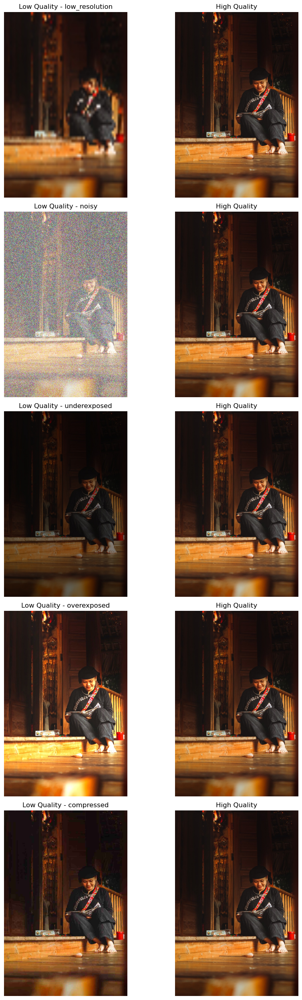

In [34]:
def sample_img(df, num_samples=5):      # Fucntion for Visualizing Sample Images!
    fig, axes = plt.subplots(num_samples, 2, figsize=(10, num_samples * 5))

    for i in range(num_samples):
        highquality_image = cv2.imread(df.iloc[i]['High_Quality'])  #Displaying high quality images!
        highquality_image = cv2.cvtColor(highquality_image, cv2.COLOR_BGR2RGB)
        lowquality_image = cv2.imread(df.iloc[i]['Low_Quality'])     #Displaying low quality images!
        lowquality_image = cv2.cvtColor(lowquality_image, cv2.COLOR_BGR2RGB)
        image_type = df.iloc[i]['Type']  #Displaying type of low quality images!

        axes[i, 0].imshow(lowquality_image)
        axes[i, 0].set_title(f'Low Quality - {image_type}')
        axes[i, 0].axis('off')

        axes[i, 1].imshow(highquality_image)
        axes[i, 1].set_title('High Quality')
        axes[i, 1].axis('off')

    plt.tight_layout()
    plt.show()

sample_img(df)

In [40]:
df.isnull().sum() #analyising for missing values!

High_Quality    0
Low_Quality     0
Type            0
dtype: int64

In [41]:
print(f"Number of duplicate rows: {df.duplicated().sum()}") #analyising for dublicate rows!

Number of duplicate rows: 0


## Data Visualization

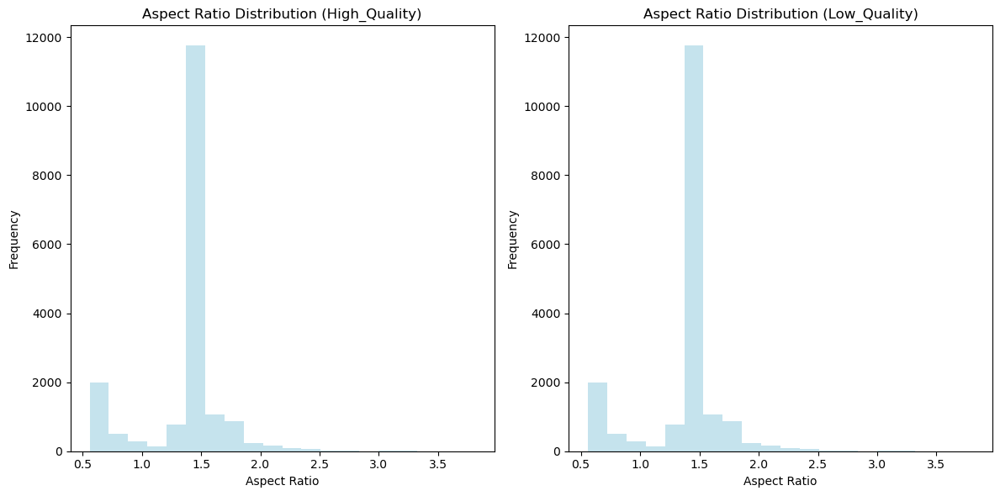

In [39]:
def img_analyzing(df):   #ploting aspect ratio for the low and high-quality image!
    fig, axs = plt.subplots(1, 2, figsize=(12, 6))

    for i, quality in enumerate(['High_Quality', 'Low_Quality']):
        sizes = []
        for _, row in df.iterrows():
            image = cv2.imread(row[quality])
            sizes.append(image.shape[:2])

        sizes = pd.DataFrame(sizes, columns=['Height', 'Width'])

        axs[i].hist(sizes['Width'] / sizes['Height'], bins=20, color='lightblue', alpha=0.7)
        axs[i].set_title(f'Aspect Ratio Distribution ({quality})')
        axs[i].set_xlabel('Aspect Ratio')
        axs[i].set_ylabel('Frequency')

    plt.tight_layout()
    plt.show()

img_analyzing(df)

In [68]:
def img_intensity_plot(img_path):   #function to plot intensity distribution of images!
    image = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    histogram = cv2.calcHist([image], [0], None, [256], [0, 256])

    plt.figure(figsize=(8, 4))
    plt.plot(histogram, color='gray')
    plt.title('Image Intensity Distribution')
    plt.xlabel('Pixel Intensity')
    plt.ylabel('Frequency')
    plt.show()

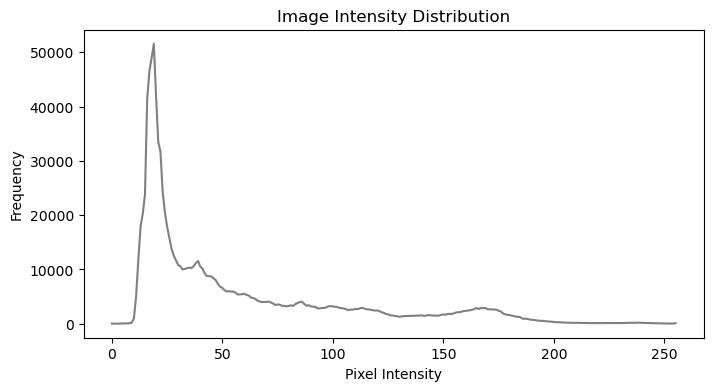

In [69]:
sample_image_path = df.iloc[0]['High_Quality']
img_intensity_plot(sample_image_path)  #ploting the histogram for intensity

In [70]:
def rgb_distribution_plot(image_path):   #function for plotting RGB distribution!
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    color = ('red', 'green', 'blue')

    plt.figure(figsize=(8, 4))
    for i, col in enumerate(color):
        histogram = cv2.calcHist([image], [i], None, [256], [0, 256])
        plt.plot(histogram, color=col,label=col)
    plt.title('RGB Channel Distribution of COLORS',fontweight='bold')
    plt.xlabel('Pixel Intensity')
    plt.ylabel('Frequency')
    plt.legend(title='RGB Distribution')
    plt.show()

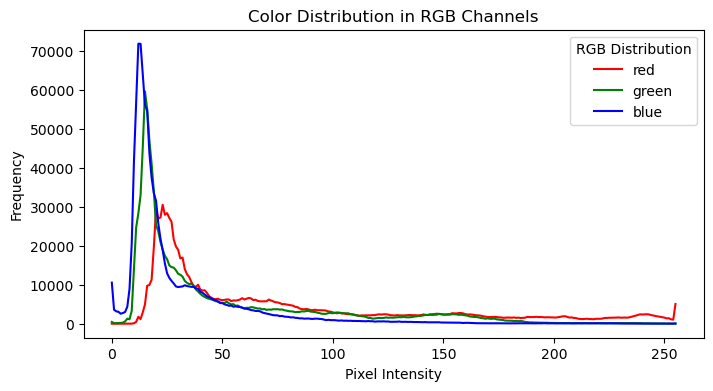

In [71]:
rgb_distribution_plot(sample_image_path)   #ploting histogram for RGB distribution!

In [84]:
def img_sharpness(img_path):  # fuction defining Comparison of Image Sharpness!
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    var_laplace = np.var(laplace(img))
    return var_laplace

In [85]:
highquality_sharpness = df['High_Quality'].apply(img_sharpness)
print("Avg sharpness for high-quality images:", round(highquality_sharpness.mean(), 2))
lowquality_sharpness = df['Low_Quality'].apply(img_sharpness)
print("Avg sharpness for low-quality images:", round(lowquality_sharpness.mean(), 2))

Avg sharpness for high-quality images: 13185.76
Avg sharpness for low-quality images: 11130.92


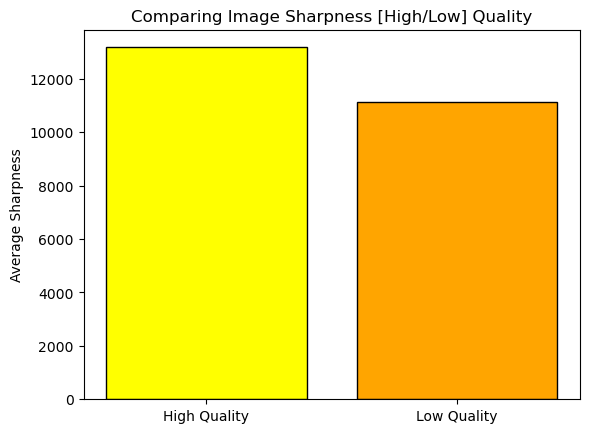

In [86]:
labels = ['High Quality', 'Low Quality']
val_sharpness = [highquality_sharpness.mean(), lowquality_sharpness.mean()]

plt.bar(labels, val_sharpness, color=['yellow', 'orange'], edgecolor='black') #ploting high and low quality image's avg sharpness!
plt.ylabel('Average Sharpness')
plt.title('Comparing Image Sharpness [High/Low] Quality')
plt.show()

In [87]:
def img_contrast(img_path):   # fuction defining Comparison of Image Contrast!
    image = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    contrast = image.std()
    return contrast

In [88]:
highquality_contrast = df['High_Quality'].apply(img_contrast)
print("Avg contrast of high-quality images:", round(highquality_contrast.mean(), 2))
lowquality_contrast = df['Low_Quality'].apply(img_contrast)
print("Avg contrast for low-quality images:", round(lowquality_contrast.mean(), 2))

Avg contrast of high-quality images: 54.64
Avg contrast for low-quality images: 50.95


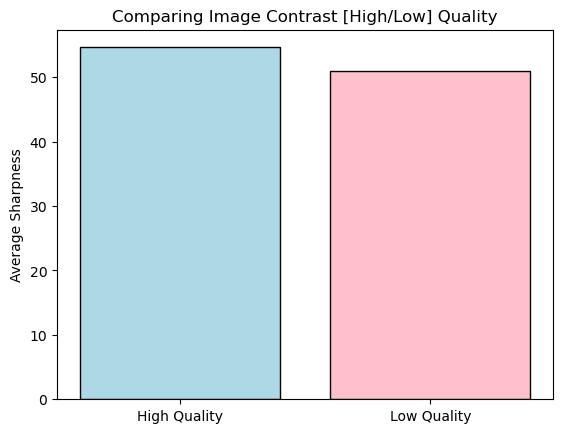

In [89]:
labels = ['High Quality', 'Low Quality']
sharpness_values = [highquality_contrast.mean(), lowquality_contrast.mean()]

plt.bar(labels, sharpness_values, color=['lightblue', 'pink'], edgecolor='black') #ploting high and low quality image's avg contrast!
plt.ylabel('Average Sharpness')
plt.title('Comparing Image Contrast [High/Low] Quality')
plt.show()

In [90]:
metrics_df = pd.DataFrame({      
    'Sharpness_HQ': highquality_sharpness,
    'Sharpness_LQ': lowquality_sharpness,
    'Contrast_HQ': highquality_contrast,
    'Contrast_LQ': lowquality_contrast
})   # Genrating combined metrics based on sharpness and contrast

C:\Users\rahul\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\rahul\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


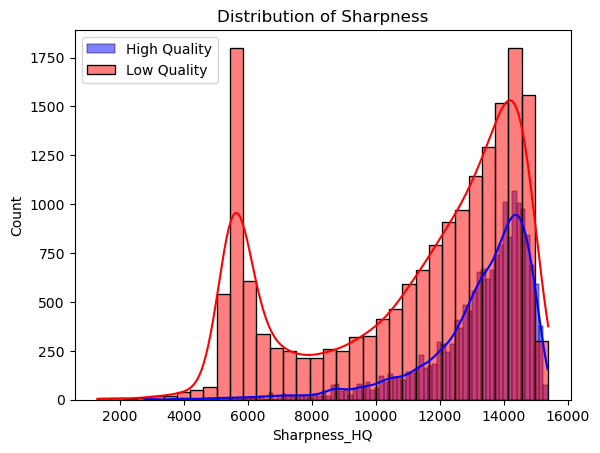

In [91]:
sns.histplot(metrics_df, x='Sharpness_HQ', color='blue', label='High Quality', kde=True)
sns.histplot(metrics_df, x='Sharpness_LQ', color='red', label='Low Quality', kde=True)
plt.title('Distribution of Sharpness')  # Plot histogram for sharpness comparrision b/w high and low quality
plt.legend()
plt.show()

Note: As you can observe  While comparing the sharpness of low quality and high-quality images we observed low quality image had more sharpness i.e because of the presence of more overexposed data in the dataset the low-exposed data but in conclusion model worked fine

C:\Users\rahul\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\rahul\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


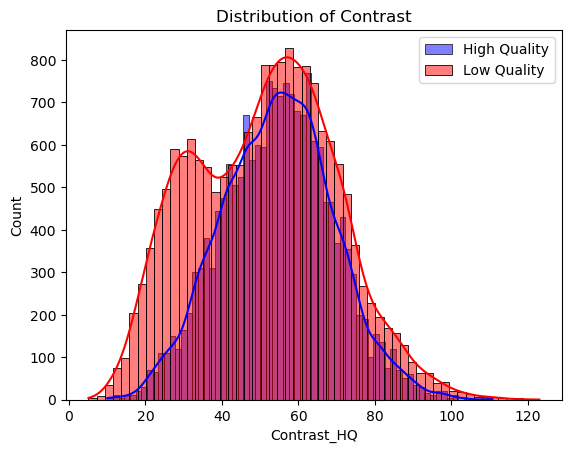

In [92]:
sns.histplot(metrics_df, x='Contrast_HQ', color='blue', label='High Quality', kde=True)
sns.histplot(metrics_df, x='Contrast_LQ', color='red', label='Low Quality', kde=True)
plt.title('Distribution of Contrast') # Plot histogram for contrast comparrision b/w high and low quality
plt.legend()
plt.show()

In [97]:
def img_symmetry(img_path):
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    height, width = img.shape
    mid_point = width // 2
    first_half = img[:, :mid_point]
    second_half = cv2.flip(img[:, -mid_point:], 1)  #using the midpoint of the image to explain the symmetry properly!
    score_of_symmetry = np.sum((first_half - second_half) ** 2)
    return score_of_symmetry

In [99]:
score_of_symmetry = df['High_Quality'].apply(img_symmetry)
print("Avg symmetry score of high-quality images:",round(score_of_symmetry.mean(), 2))

Avg symmetry score of high-quality images: 49701114.84


In [100]:
score_of_symmetry = df['Low_Quality'].apply(img_symmetry)
print("Avg symmetry score of low-quality images:",round(score_of_symmetry.mean(), 2))

Avg symmetry score of low-quality images: 49204489.77


In [101]:
def color_histogram(img_path1, img_path2):  #defining function to plot the color comparision
    img1 = cv2.imread(img_path1)
    img2 = cv2.imread(img_path2)
    
    color = ('b', 'g', 'r')
    plt.figure(figsize=(10, 5))
    
    for i, col in enumerate(color):
        hist_1 = cv2.calcHist([img1], [i], None, [256], [0, 256])
        plt.plot(hist_1, color=col, linestyle='-')   #solid line representing high quality! 
        
        hist_2 = cv2.calcHist([img2], [i], None, [256], [0, 256])
        plt.plot(hist_2, color=col, linestyle='--')  #-- line representing low quality! 
        
    plt.title('Plot for Color Comparison')
    plt.xlabel('Pixel Intensity')
    plt.ylabel('Frequency')
    plt.legend(['High Quality - Blue', 'Low Quality - Blue', 'High Quality - Green',
                'Low Quality - Green', 'High Quality - Red', 'Low Quality - Red'])
    plt.show()

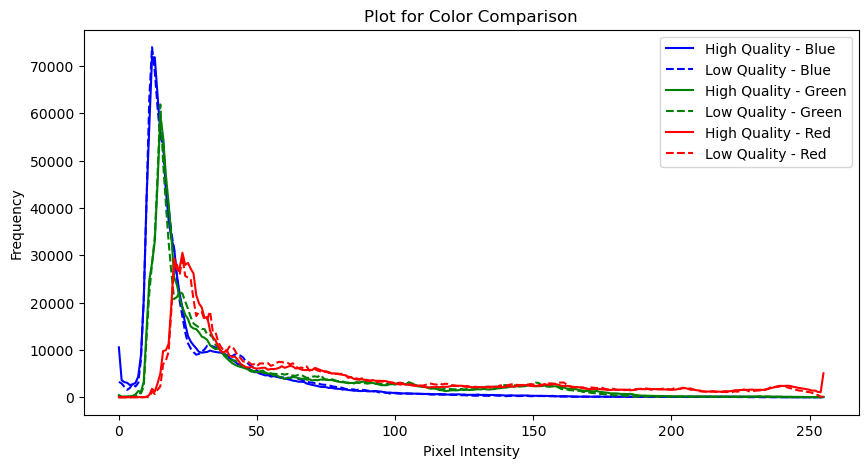

In [102]:
color_histogram(df.iloc[0]['High_Quality'], df.iloc[0]['Low_Quality'])

# Model Implementation

In [2]:
class enhanced_quality(Dataset):
    def __init__(self, csv_file, transform=None):  #path to csv file contaning images!
        self.data_frame = pd.read_csv(csv_file)
        self.transform = transform

    def __len__(self):    #calculate the number of samples in dataset!
        return len(self.data_frame)

    def __getitem__(self, idx):    #extracting image based on index and converting to rgb
        img_path_low = self.data_frame.iloc[idx]['Low_Quality']
        img_path_high = self.data_frame.iloc[idx]['High_Quality']
        
        low_img = Image.open(img_path_low).convert('RGB')
        high_img = Image.open(img_path_high).convert('RGB')

        if self.transform:
            low_img = self.transform(low_img)
            high_img = self.transform(high_img)

        return low_img, high_img

In [3]:
transform = transforms.Compose([
    transforms.Resize((256, 256)), 
    transforms.ToTensor()           
])                       #applying to resize and convert to tensor transformation to each image

data_img = enhanced_quality(csv_file='image_pairs.csv', transform=transform)
train_size = int(0.8 * len(data_img))  
test_size = len(data_img) - train_size
train_data, test_data = torch.utils.data.random_split(data_img, [train_size, test_size]) #applying train test and random split for fit transforming the model

training_set = DataLoader(train_data, batch_size=16, shuffle=True)
testing_set = DataLoader(test_data, batch_size=16, shuffle=False)

In [4]:
class CNNimgEnhancement(nn.Module):
    def __init__(self):
        super(CNNimgEnhancement, self).__init__()
        self.encoder = nn.Sequential(     #encoder part used for desampleling input images!
            nn.Conv2d(3, 64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2),
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.ReLU(),   #Linear unit activation function!
            nn.MaxPool2d(2)
        )
        self.decoder = nn.Sequential(      #decoder part used for upsampleling back to orginal size!
            nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2),
            nn.ReLU(),
            nn.ConvTranspose2d(64, 3, kernel_size=2, stride=2),
            nn.Sigmoid()  # between 0 and 1
        )

    def forward(self, x):  #defining fuction for reconstructing image to orignal size!
        x = self.encoder(x)
        x = self.decoder(x)
        return x

In [5]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu") #using cude to use gpu to train the model!
model = CNNimgEnhancement().to(device)
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)
print('Device Using: ',device)

Device Using:  cuda


In [13]:
number_of_epochs = 10   #defining number of epochs to 10 for training on training set!
for epoch in range(number_of_epochs):
    model.train()
    overall_loss = 0   
    for low_res, high_res in tqdm(training_set):  #using tqdm for progress bar!
        low_res, high_res = low_res.to(device), high_res.to(device)
        optimizer.zero_grad()
        result = model(low_res)
        loss = criterion(result, high_res)    
        loss.backward()
        optimizer.step()
        overall_loss += loss.item()    #aggregated loss function for all 10 epochs!
    print(f"Epoch {epoch+1}/{number_of_epochs}, Loss: {overall_loss/len(training_set)}")


100%|████████████████████████████████████████████████████████████████████████████████| 900/900 [17:07<00:00,  1.14s/it]


Epoch 1/10, Loss: 0.024683682514975467


100%|████████████████████████████████████████████████████████████████████████████████| 900/900 [13:57<00:00,  1.07it/s]


Epoch 2/10, Loss: 0.01613107244587607


100%|████████████████████████████████████████████████████████████████████████████████| 900/900 [13:41<00:00,  1.10it/s]


Epoch 3/10, Loss: 0.01447313051412089


100%|████████████████████████████████████████████████████████████████████████████████| 900/900 [13:43<00:00,  1.09it/s]


Epoch 4/10, Loss: 0.013824811831841038


100%|████████████████████████████████████████████████████████████████████████████████| 900/900 [13:41<00:00,  1.10it/s]


Epoch 5/10, Loss: 0.013277824209589097


100%|████████████████████████████████████████████████████████████████████████████████| 900/900 [13:41<00:00,  1.10it/s]


Epoch 6/10, Loss: 0.013053240527709325


100%|████████████████████████████████████████████████████████████████████████████████| 900/900 [13:43<00:00,  1.09it/s]


Epoch 7/10, Loss: 0.01298204824845824


100%|████████████████████████████████████████████████████████████████████████████████| 900/900 [13:39<00:00,  1.10it/s]


Epoch 8/10, Loss: 0.012296784428051776


100%|████████████████████████████████████████████████████████████████████████████████| 900/900 [13:40<00:00,  1.10it/s]


Epoch 9/10, Loss: 0.012349805515776906


100%|████████████████████████████████████████████████████████████████████████████████| 900/900 [13:44<00:00,  1.09it/s]

Epoch 10/10, Loss: 0.012030689471090834


In [14]:
def MSE_calculation(model, loader, device):  #function for the calculation of the mse!
    model.eval()
    total_mse = 0.0
    with torch.no_grad():
        for low_res, high_res in loader:
            low_res, high_res = low_res.to(device), high_res.to(device)
            result = model(low_res)
            total_mse += nn.functional.mse_loss(result, high_res, reduction='sum').item()  
    return total_mse / len(loader.dataset)

mse_result = MSE_calculation(model, testing_set, device)
print(f'Mean Squared Error: {mse_result}')  #showing the mse!

Mean Squared Error: 2344.4024723307293


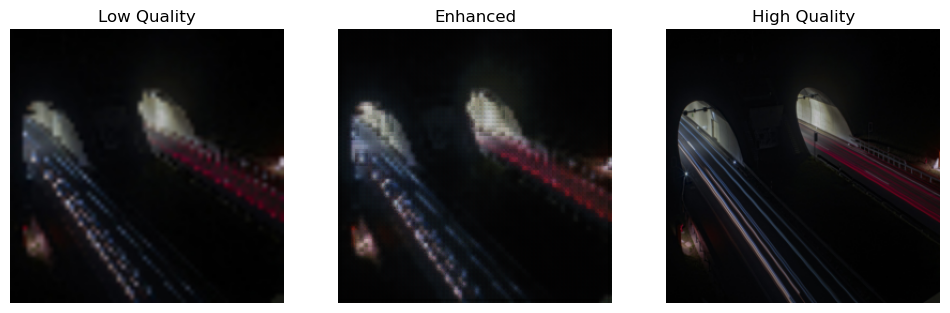

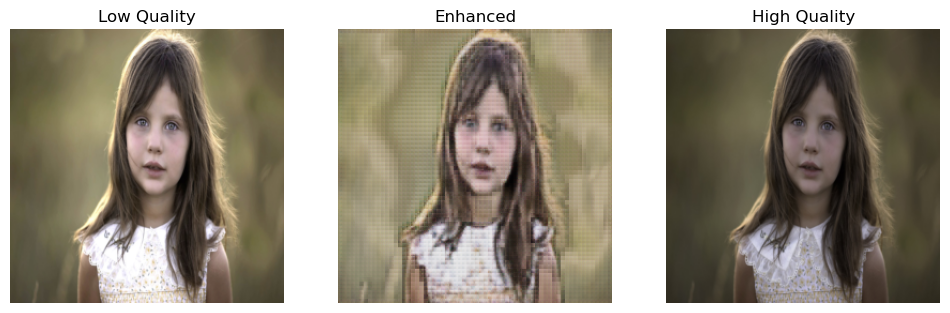

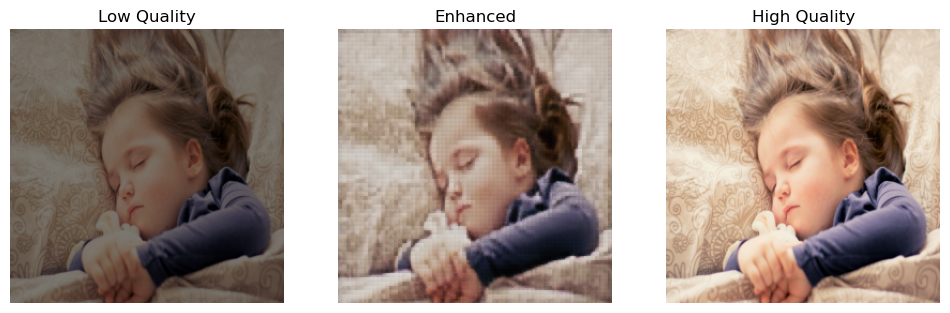

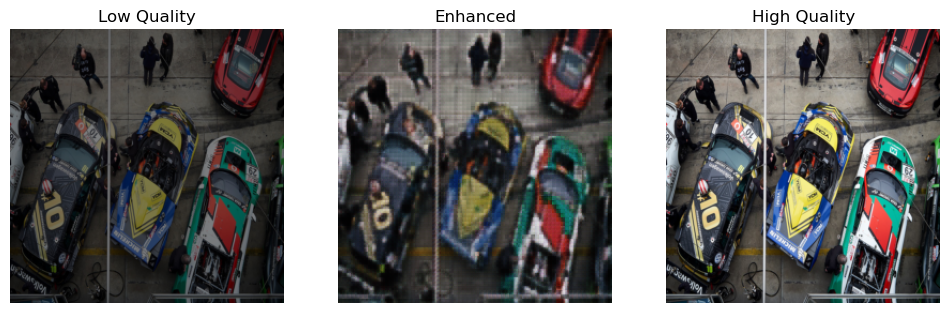

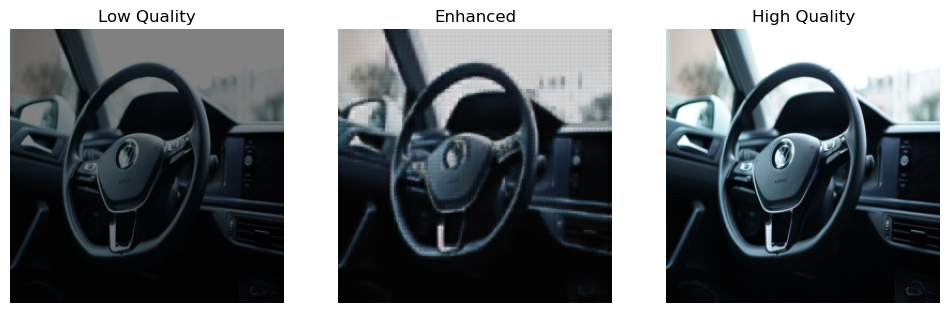

...

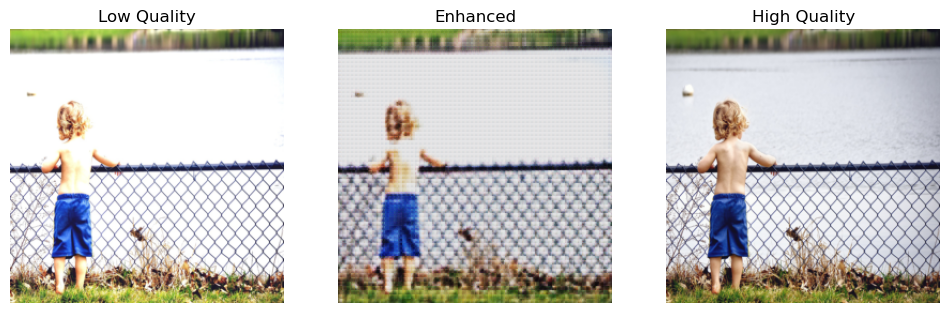

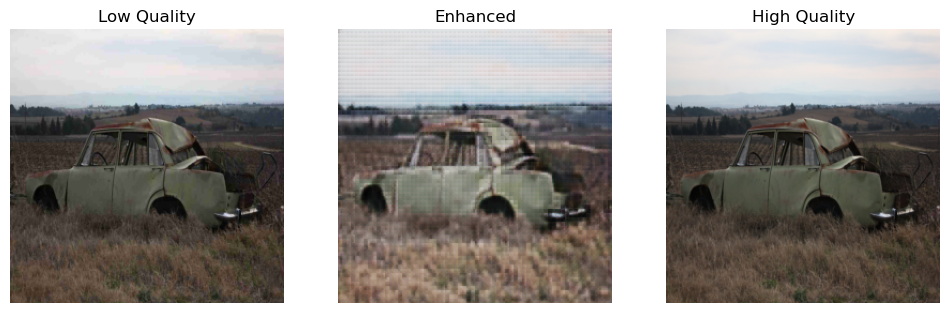

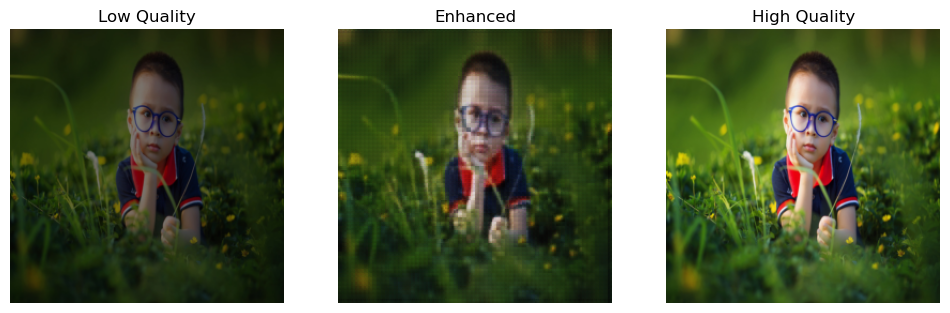

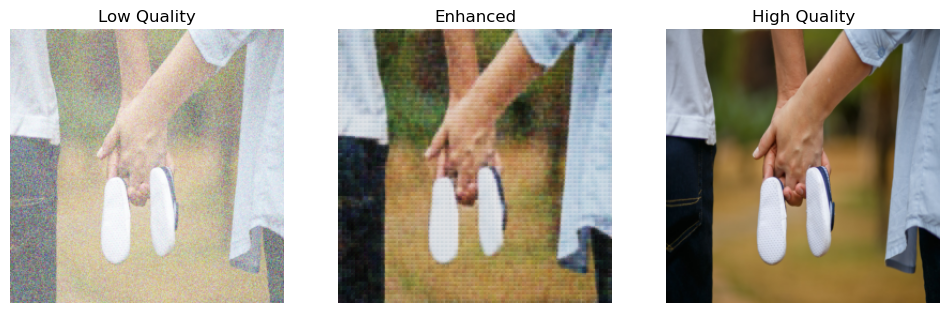

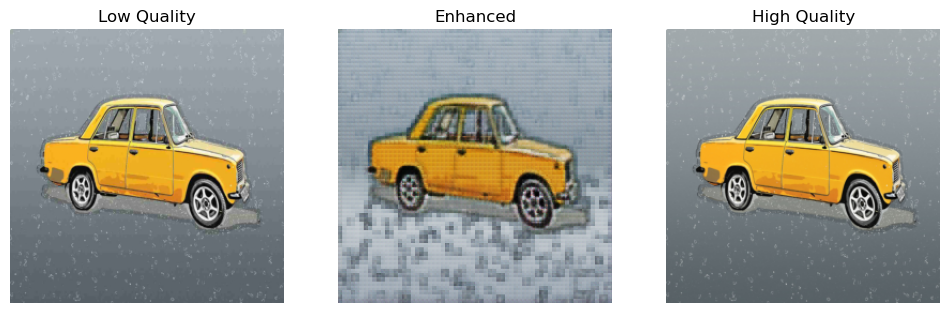

In [9]:
def img_matrix(model, loader, device, num_images=5):
    model.eval()
    processed_img = 0
    with torch.no_grad():
        for low_res, high_res in loader:
            if processed_img >= num_images:
                break
            low_res, high_res = low_res.to(device), high_res.to(device)
            result = model(low_res)
            result = result.cpu().numpy()  #using cpu for visualization!
            low_res = low_res.cpu().numpy()
            high_res = high_res.cpu().numpy()

            for i in range(result.shape[0]):
                if processed_img >= num_images:
                    break
                plt.figure(figsize=(12, 4))

                
                plt.subplot(1, 3, 1)  #creating first column as Low-quality image
                plt.imshow(np.transpose(low_res[i], (1, 2, 0)))
                plt.title('Low Quality')
                plt.axis('off')

               
                plt.subplot(1, 3, 2)  #creating second column as Enhanced image
                plt.imshow(np.transpose(result[i], (1, 2, 0)))
                plt.title('Enhanced')
                plt.axis('off')

                
                plt.subplot(1, 3, 3) #creating third column as High-quality image
                plt.imshow(np.transpose(high_res[i], (1, 2, 0)))
                plt.title('High Quality')
                plt.axis('off')

                plt.show()
                processed_img += 1

img_matrix(model, testing_set, device, num_images=30) # Display comparisons matrix for all 3 types of images!

In [16]:
torch.save(model, 'image_quality_enhancer.pth') #saving the entire model

In [6]:
model = torch.load('image_quality_enhancer.pth')  #loading the model
model.eval()

CNNimgEnhancement(
  (encoder): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): ReLU()
    (5): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (decoder): Sequential(
    (0): ConvTranspose2d(128, 64, kernel_size=(2, 2), stride=(2, 2))
    (1): ReLU()
    (2): ConvTranspose2d(64, 3, kernel_size=(2, 2), stride=(2, 2))
    (3): Sigmoid()
  )
)

In [7]:
 def load_image(image_path, device):  #defining function for loading input image!
    
    transform = transforms.Compose([
        transforms.Resize((256, 256)),  # transforming input img to model specific expectations!
        transforms.ToTensor()           
    ])
    
    
    image = Image.open(image_path).convert('RGB')  #converting to RGB
    image = transform(image).unsqueeze(0)  
    return image.to(device)  #writting image to device

def enhanced_image(model, image_tensor):  #evaluating enhanced image based on trained model
    model.eval()     #evaluating trained model
    with torch.no_grad():  
        output = model(image_tensor)
    return output

In [8]:
input_img_path = 'test image 4.jpeg'  # inserting the low-quality image that needs to be enhanced!
input_img_tensor = load_image(input_img_path, device)


enhanced_img_tensor = enhanced_image(model, input_img_tensor) # processing the image for enhancement

input_img_array = input_img_tensor.squeeze(0).cpu().numpy().transpose(1, 2, 0)
enhanced_img_array = enhanced_img_tensor.squeeze(0).cpu().numpy().transpose(1, 2, 0)

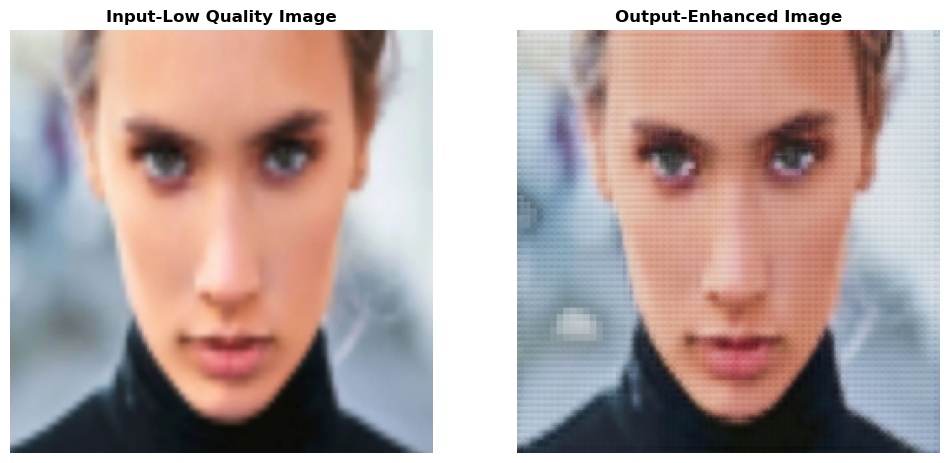

In [9]:
plt.figure(figsize=(12, 6))  # Displaying the input low-quality image and enhanced image parlley!
plt.subplot(1, 2, 1)
plt.imshow(input_img_array)
plt.title('Input-Low Quality Image',fontweight='bold')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(enhanced_img_array)
plt.title('Output-Enhanced Image',fontweight='bold')
plt.axis('off')

plt.show()

In [10]:
def pixelmap(img):
    img = img.convert('RGB')  #changing the img to RGB format!
    data = img.tobytes("raw", "RGB")
    qim = QImage(data, img.size[0], img.size[1], QImage.Format_RGB888)
    pixmap = QPixmap.fromImage(qim) #converting Qimage to Qpixmap for easy use of GUI in QT!
    return pixmap

In [11]:
class img_enhancer(QWidget):   #function to make user interface!
    def __init__(self):
        super().__init__()
        self.initUI()

    def initUI(self):    #setting the user interface!
        self.setWindowTitle('Image Quality Enhancement')   #Giving title to the application!
        self.setGeometry(100, 100, 800, 600)
        
        layout = QVBoxLayout()

        self.original_image_label = QLabel(self)  #laberling both orignal and enchanced images!
        self.enhanced_image_label = QLabel(self)

        btn_load = QPushButton('Load Image', self)
        btn_load.clicked.connect(self.open_image)    

        btn_exit = QPushButton('Exit', self)  #  exit button
        btn_exit.clicked.connect(self.close)  

        layout.addWidget(self.original_image_label)
        layout.addWidget(self.enhanced_image_label)
        layout.addWidget(btn_load)
        layout.addWidget(btn_exit)  # Add the exit button to the layout

        self.setLayout(layout)

    def open_image(self):
        file_name, _ = QFileDialog.getOpenFileName(self, 'Open Image', '', 'Image Files (*.png *.jpg *.bmp *.jpeg)')  #getting the image data of png jpg jpeg bmp!
        if file_name:
            original_image = Image.open(file_name)
            self.show_img(original_image, self.original_image_label)

            enhanced_image = self.img_process(original_image)
            self.show_img(enhanced_image, self.enhanced_image_label)

    def img_process(self, image):  #intigrating our model to enchance the image quality
        transform = transforms.Compose([
            transforms.Resize((256, 256)),
            transforms.ToTensor()
        ])
        image = transform(image).unsqueeze(0)

        device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  #selecting the device!
        image = image.to(device)
        with torch.no_grad():
            output = model(image)  
            output = output.squeeze().cpu().numpy()
            output = np.transpose(output, (1, 2, 0)) * 255
            output = output.astype(np.uint8)
            output = Image.fromarray(output)
        return output

    def show_img(self, image, label):
        pixmap = pixelmap(image)  
        label.setPixmap(pixmap.scaled(350, 350, transformMode=QtCore.Qt.SmoothTransformation))

In [ ]:
app = QApplication(sys.argv)
ex = img_enhancer()
ex.show()
sys.exit(app.exec_())